In [1]:
%pylab
%cd /home/ahaase/pc/Daten/DWBA
import numpy as np
import matplotlib.gridspec as gridspec
import fitting
import reflectivity
import pso
import helper
data_color = "#A60628"
fit_color = "#348ABD"
third_color = "#467821"

Using matplotlib backend: Qt5Agg
Populating the interactive namespace from numpy and matplotlib
/home/ahaase/pc/Daten/DWBA


## Mo/Si

In [2]:
def eval_mosi(p, wls, ang):
    sio2, si, mo, c, b4c, s, d_si, d_mo, d_C, d_b4c= p
    N = 64
    import numpy as np
    shift = 0.0
    sigma = s
    stack = [c,si,b4c,mo]
    capthicknesses = [sio2,si,b4c,mo]
    henkes = ["C",'Si',"B4C",'Mo']
    caphenkes = ["SiO2",'Si','B4C',"Mo"]
    densities = [d_C,d_si,d_b4c,d_mo]
    capdensities = [d_si,d_si,d_b4c,d_mo]
    re, tr ,n, t = reflectivity.fields(ang,
                     wls,
                     stack,
                     henkes,
                     N,
                     None,sigma,
                     "Si", densities,None,0,capthicknesses, caphenkes, capdensities)             
        
    euv = np.abs(re[0])**2

    return euv, n, t

In [3]:
p= [1.0,4.0,2.0,0.5,0.5,0.1,1.0,1.0,1.0,1.0]
wavelengths = linspace(12.0,16.0,600)
res, n, t = eval_mosi(p, wavelengths, 6.0)

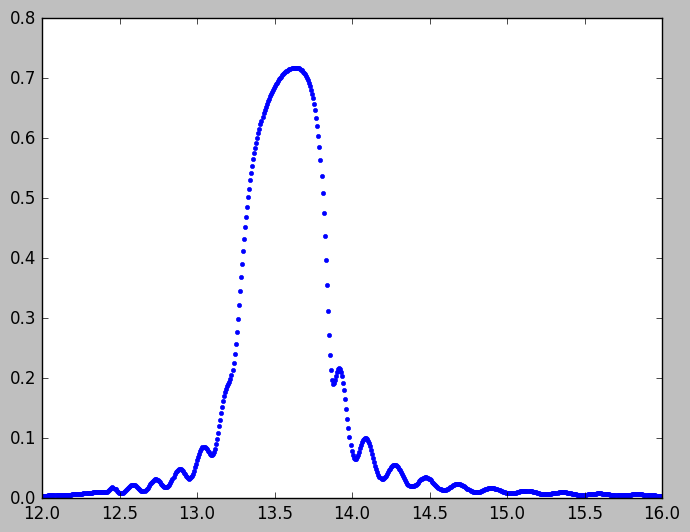

In [4]:
fig = figure()
ax = fig.add_subplot(111)
ax.plot(wavelengths,res, '.')
fig

In [5]:
fig = figure()
ax = fig.add_subplot(111)
helper.plot_multilayer(ax,  t[:-1], n[1:,200])

## Cr/Sc (with mixlayers)

In [6]:
def eval_crsc(wls, ang):
    D, mix, Gamma_sc, sigma_diffusion, sigma_gamma, rough, density_sc, density_cr = [1.5736961436279704,
                                                                                     0.55618777932127605,
                                                                                     0.47576190541953761,
                                                                                     1.3404317515427771,
                                                                                     0.16410622448372308,
                                                                                     0.10629774652817736,
                                                                                     0.94450571167340258,
                                                                                     0.97511303075875022]
    cr_cap, cr_dens = [2.4946752717471536, 0.79095132648073452]
    
    
    #Direct parametrization of multilayer
    N = 400  
    sc, cr = [D*Gamma_sc, D*(1-Gamma_sc)]
    densities = [density_sc, density_cr]
    intermix = [mix,mix]+[mix,mix]*N
    sigma = np.array([sigma_diffusion*sigma_gamma,sigma_diffusion*(1-sigma_gamma)]+[sigma_diffusion*sigma_gamma,sigma_diffusion*(1-sigma_gamma)]*N)
    sigma = sigma.reshape((len(sigma),1))
    
    #periodic part
    thicknesses = [sc, cr]
    materials = ['Sc','Cr']
    roughness = rough
    
    #capping layer
    cap_thicknesses = [cr_cap]
    cap_materials = ["Cr"]
    cap_densities = [cr_dens]
    
    re, tr ,n, t = reflectivity.fields(ang,
                     wls,
                     thicknesses,
                     materials,
                     N,
                     sigma, roughness,
                     "Si", densities, intermix, 15,
                             cap_thicknesses,cap_materials,cap_densities)    
    
    euv = np.abs(re[0])**2

    return euv, n, t

In [7]:
wavelengths = linspace(3.1,3.2,600)
res, n, t = eval_crsc(wavelengths,1.5)

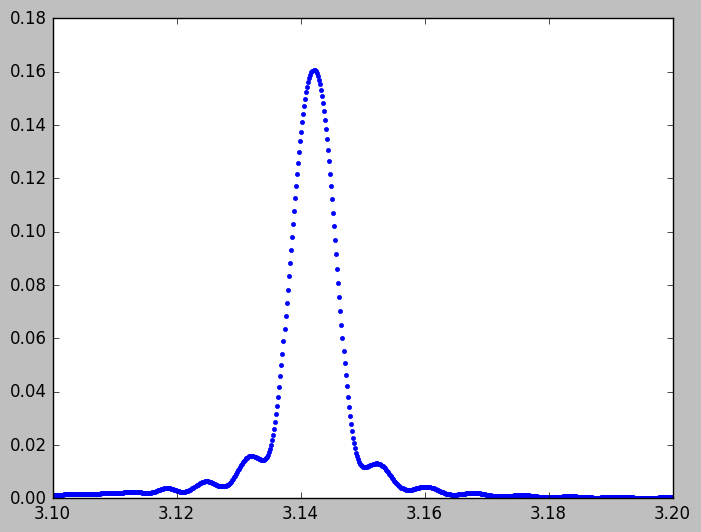

In [8]:
fig = figure()
ax = fig.add_subplot(111)
ax.plot(wavelengths,res, '.')
fig

In [9]:
fig = figure()
ax = fig.add_subplot(111)
helper.plot_multilayer(ax,  t, n[:,10])

## MCMC

In [12]:
import corner
import datetime

import matplotlib
matplotlib.use('Tkagg')
from matplotlib import pyplot as plt

#from setup_fit_e4 import *

import emcee

def lnprior(x):
    for i, y in enumerate(x):
        if y < lb[i] or y > ub[i]:
            return -np.inf
        if x[1]+x[2]+x[3]+x[8]>9.0:
            return -np.inf
    return 0.0

# we use e^(-chisqr/2) as our likelihood, with chisqr from the log-intensities.
def lnlike(x):
    return -objective(x)/2

# combined probability
def lnprob(x):
    lp = lnprior(x)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike(x)

from IPython.display import clear_output
def mcmc(xopt, theview, nwalkers=100, steps=1000, start=None, filenames="progress", samplename="PS56XX", **kwargs):
    # initialize walkers around our solution from pso, using a tiny gaussian ball around xopt
    # use 500 walkers to get better statistics
    ndim = len(xopt)
    if start is None:
        start_pos = [xopt + 1e-4*np.random.randn(ndim) for i in range(nwalkers)]
    else:
        start_pos = start

    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, pool=theview, threads=None ,**kwargs)
    #sampler.run_mcmc(start_pos, steps)
    start = datetime.datetime.now()
    for sn, st in enumerate(sampler.sample(start_pos, iterations=steps)):
        if sn % 50== 0:
            print('MCMC: {} steps done in {}'.format(sn+1, datetime.datetime.now()-start))
            print('Total time estimate: {}'.format(steps*(datetime.datetime.now()-start)/(sn+1)))
            print('Total time remaining: {}'.format((steps-sn+1)*(datetime.datetime.now()-start)/(sn+1)))
            plot_chains_collective(sampler, fname=filenames, ndim=ndim, lim=sn)
            np.save("chain_%s_thesis_intermediate.npy" % samplename, sampler.chain)
            np.save("lnprob_%s_thesis_intermediate.npy" % samplename, sampler.lnprobability)

    # we throw away the first steps as burn-in
    samples = sampler.chain[:, :, :].reshape((-1, ndim))

    return sampler, samples

# some diagnostics
def plot_chains(sampler, fname=None, ndim=ndim, lim=1000):
    figures = {}
    for k in xrange(ndim):
        figures[cols[k]] = plt.figure()
        plt.title(cols[k])
        for i in xrange(len(sampler.chain)):
            plt.plot(sampler.chain[i,:lim,k], color='k', alpha=0.02)
    if fname is not None:
        for col in figures:
            figures[col].savefig(fname + col + '.png')
            plt.close(figures[col])
        return
    return figures

def plot_chains_collective(sampler, fname=None, ndim=ndim, lim=1000):
    figure = plt.figure(figsize=(18,14))
    ax = []
    for i in xrange(ndim):
        ax.append(figure.add_subplot(4,4,i+1))
    for k in xrange(ndim):
        ax[k].set_title(cols[k])
        for i in xrange(len(sampler.chain)):
            ax[k].plot(sampler.chain[i,:lim,k], color='k', alpha=0.02)
    if fname is not None:
        figure.savefig(fname + '.png')
        plt.close(figure)
        return
    return figures

def objective(p):
    res = residual_mosi(p, *arguments)
    chisq = np.sum(res)/len(res)
    return chisq

/home/ahaase/anaconda2/lib/python2.7/site-packages/matplotlib/__init__.py:1357: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


In [13]:
arguments = (wl, dat, err)

In [14]:
from ipyparallel import Client


# Set up the interface to the ipcluster.
c = Client(profile='main', retries=5)
view = c[:]
lbview = c.load_balanced_view()
def push():
    view.execute("import numpy as np")
    view.execute("import reflectivity")
    view.execute("import helper")
    view.push({"lnlike": lnlike})
    view.push({"lnprior": lnprior})
    view.push({"objective": objective})
    view.push({"cols" : cols})

    view.push({"lnprob": lnprob, 
               "residual_mosi" : residual_mosi, 
               "lb" : lb, 
               "ub" : ub, 
               "arguments": arguments})
    print len(view)
push()

12


In [15]:
objective(p)

NameError: name 'p' is not defined

In [ ]:
%cd /home/ahaase/Dropbox
chain = np.load("chain_%s_EUV.npy" % name)

In [ ]:
import numpy as np
alpha = np.radians(90)
gamma = np.radians(0)
print np.degrees(np.arctan(np.sqrt(np.tan(alpha)**2+np.tan(gamma)**2)))

In [16]:
%cd /home/ahaase/Dropbox
%pylab
walker = 80*4
iterations = 4000


start = np.zeros((walker,len(lb)))
for i in xrange(walker):
    while True:
        for j in xrange(len(lb)):
            start[i,j] = random.uniform(lb[j],ub[j])
        if lnprior(start[i,:]) != -np.inf:
            break
#start = chain[-1,:]

push()
sampler, samples = mcmc(lb, lbview, walker, iterations, start, samplename="PTB17")
plot_chains_collective(sampler, fname=name+'_EUV', ndim=start.shape[-1], lim=iterations)

name='PTB17_thesis'
%cd /home/ahaase/Dropbox/PTB/Dissertation/thesis/material/
np.save("lnprobability_%s_EUV.npy" % name,sampler.lnprobability)
np.save("chain_%s_EUV.npy" % name,sampler.chain)
np.save("acceptance_fraction_%s_EUV.npy" % name,sampler.acceptance_fraction)

/home/ahaase/Dropbox
Using matplotlib backend: agg
Populating the interactive namespace from numpy and matplotlib
12


/home/ahaase/anaconda2/lib/python2.7/site-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['pi', 'e']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


MCMC: 1 steps done in 0:00:04.415532
Total time estimate: 4:54:24.672000
Total time remaining: 4:54:29.916375
MCMC: 51 steps done in 0:01:16.249867
Total time estimate: 1:39:40.504862
Total time remaining: 1:38:27.263200
MCMC: 101 steps done in 0:02:33.515578
Total time estimate: 1:41:19.883564
Total time remaining: 1:38:49.426993
MCMC: 151 steps done in 0:03:46.966825
Total time estimate: 1:40:12.382834
Total time remaining: 1:36:28.423104
MCMC: 201 steps done in 0:05:01.485819
Total time estimate: 1:39:59.724398
Total time remaining: 1:35:01.239508
MCMC: 251 steps done in 0:06:11.798438
Total time estimate: 1:38:45.087665
Total time remaining: 1:32:36.253722
MCMC: 301 steps done in 0:07:23.628533
Total time estimate: 1:38:15.411614
Total time remaining: 1:30:54.739002
MCMC: 351 steps done in 0:08:35.904099
Total time estimate: 1:37:59.250735
Total time remaining: 1:29:26.286742
MCMC: 401 steps done in 0:09:46.482132
Total time estimate: 1:37:30.204478
Total time remaining: 1:27:46.64

NameError: name 'name' is not defined

In [50]:
%cd /home/ahaase/pc/Daten/DWBA

/home/ahaase/pc/Daten/DWBA


In [17]:
name = "PTB17_thesis"
%cd /home/ahaase/Dropbox/PTB/Dissertation/thesis/material/
np.save("lnprobability_%s_EUV.npy" % name,sampler.lnprobability)
np.save("chain_%s_EUV.npy" % name,sampler.chain)
np.save("acceptance_fraction_%s_EUV.npy" % name,sampler.acceptance_fraction)

/home/ahaase/Dropbox/PTB/Dissertation/thesis/material


In [46]:
%cd /home/ahaase/Dropbox/PTB/Dissertation/thesis/material/
name = "PTB17_thesis"
lnprobability =  np.load("lnprobability_%s_EUV.npy" % name)
chain = np.load("chain_%s_EUV.npy" % name)
chain = chain[:,500:,:].reshape((-1,10))
#chain = np.mean(chain, axis=0)
lnp = lnprobability[:,500:].flatten()
lnp = lnp[(chain[:,6]<1.8) & (chain[:,6]>0.6)]
chain = chain[(chain[:,6]<1.8) & (chain[:,6]>0.6)]


/home/ahaase/Dropbox/PTB/Dissertation/thesis/material


In [24]:
%cd /home/ahaase/pc/Daten/DWBA
bo = (chain[:,2]<2.75)
idx = np.nanargmax(lnp[bo])
pc = (chain[bo,:])[idx,:]
print objective(pc)
pc

/home/ahaase/pc/Daten/DWBA
17.8663368101


array([ 3.19439904,  2.42090645,  2.459909  ,  0.81130589,  0.32289642,
        0.88288504,  0.9886541 ,  0.83327468,  1.3081704 ,  0.90863311])

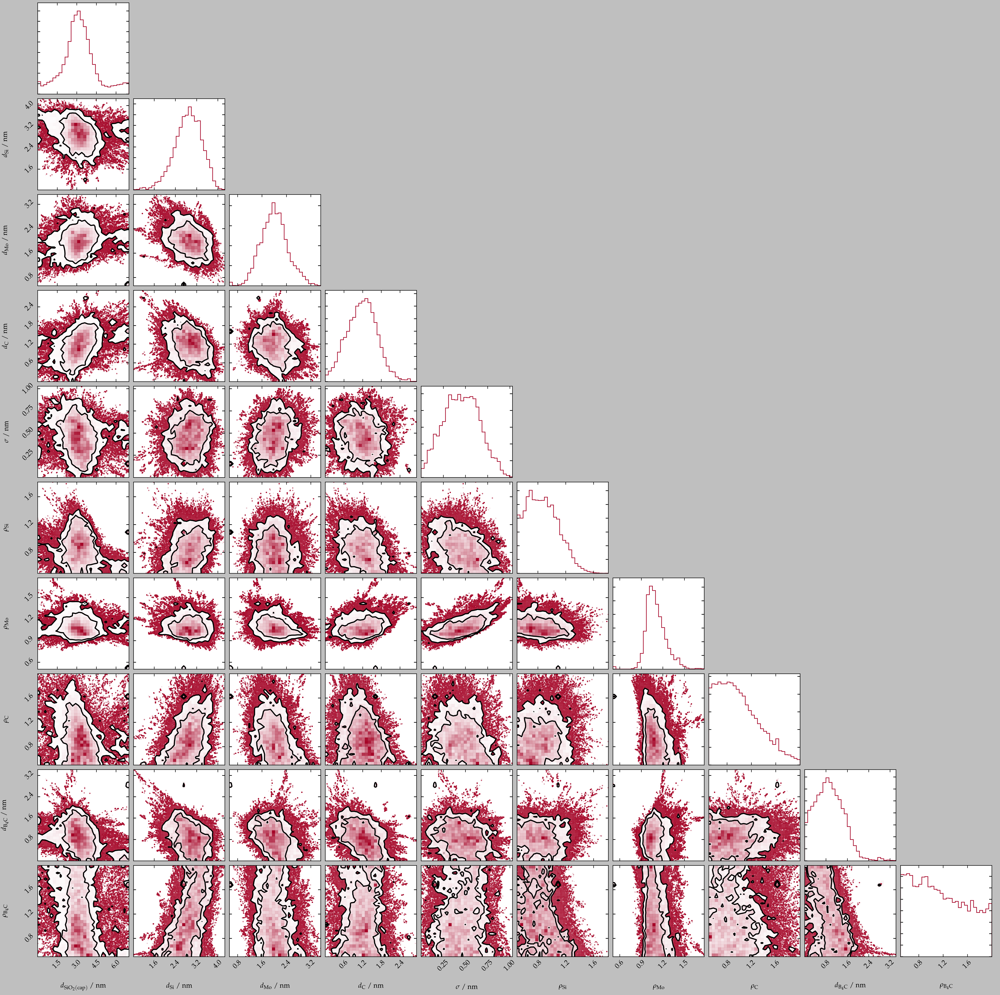

In [20]:
fig = corner.corner(chain, bins=30,levels=[1 - np.exp(-(1/1)**2/2),1 - np.exp(-(2/1)**2/2)],color='#A60628',
              contour_kwargs={'colors':'black'}, labels=array(cols), figsize=(3,3))
fig

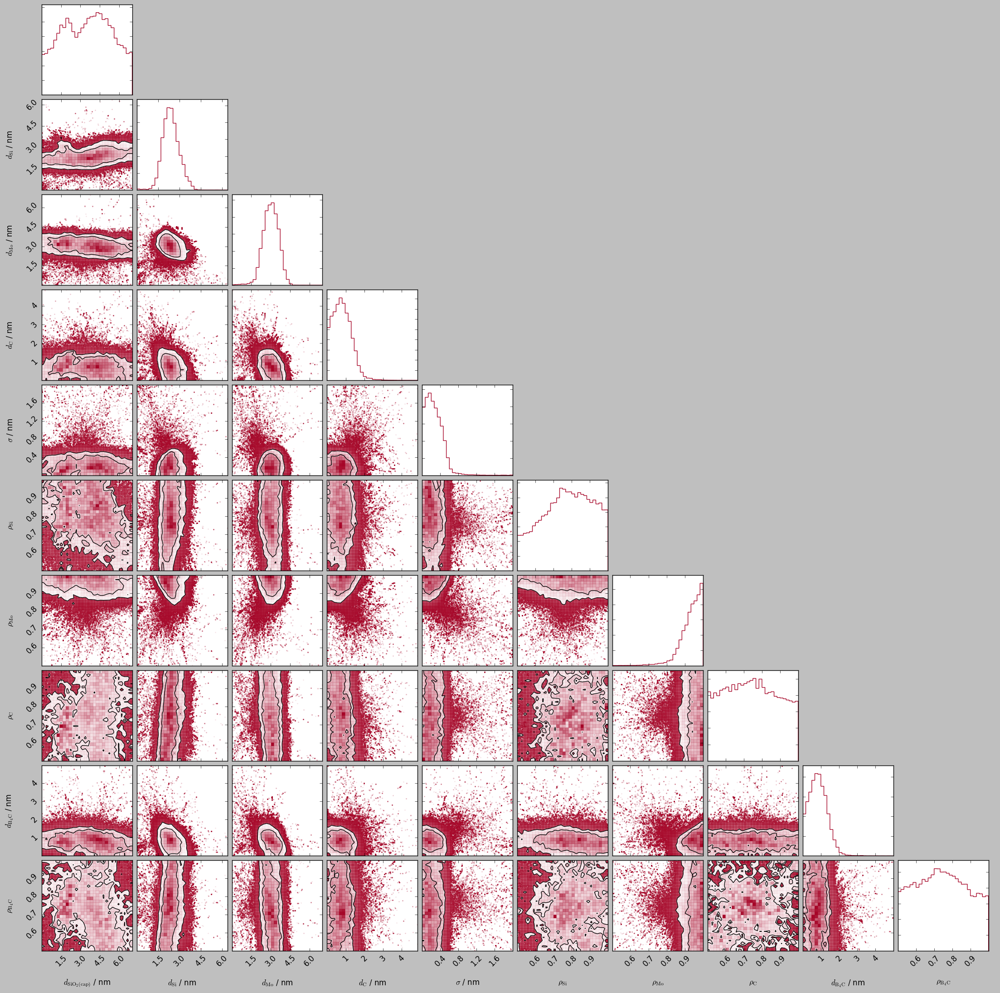

In [58]:
fig = corner.corner(chain[chain[:,6]<1.9], bins=30,levels=[1 - np.exp(-(1/1)**2/2),1 - np.exp(-(2/1)**2/2)],color='#A60628',
              contour_kwargs={'colors':'black'}, labels=array(cols), figsize=(3,3))
fig

In [ ]:
fig = corner.corner(chain[:,[0,1,2,4]], bins=30,levels=[1 - np.exp(-(1/1)**2/2),1 - np.exp(-(2/1)**2/2)],color='#A60628',
              contour_kwargs={'colors':'black'}, truths=pc[[0,1,2,4]], labels=array(cols)[[0,1,2,4]], figsize=(3,3))
fig

In [21]:
array(cols)[[0,1,2,4]]

array(['$d_{\\mathrm{SiO}_2\\mathrm{(cap)}}$', '$d_\\mathrm{Si}$',
       '$d_\\mathrm{Mo}$', '$\\sigma$'], 
      dtype='|S34')

In [22]:
fig_golden_ratio(15.0)

(5.905511811023622, 3.6498836903730667)

In [62]:
p = pc

In [63]:
cols

['$d_{\\mathrm{SiO}_2\\mathrm{(cap)}}$ / nm',
 '$d_\\mathrm{Si}$ / nm',
 '$d_\\mathrm{Mo}$ / nm',
 '$d_\\mathrm{C}$ / nm',
 '$\\sigma$ / nm',
 '$\\rho_\\mathrm{Si}$',
 '$\\rho_\\mathrm{Mo}$',
 '$\\rho_\\mathrm{C}$',
 '$d_{\\mathrm{B}_4\\mathrm{C}}$ / nm',
 '$\\rho_{\\mathrm{B}_4\\mathrm{C}}$']

In [64]:
p

array([ 3.19439904,  2.42090645,  2.459909  ,  0.81130589,  0.32289642,
        0.88288504,  0.9886541 ,  0.83327468,  1.3081704 ,  0.90863311])

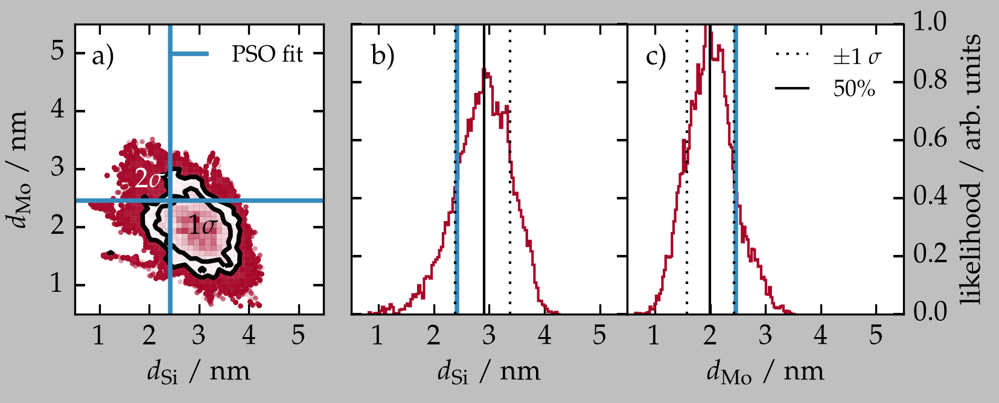

In [68]:
fig = plt.figure(figsize=(5.906,2))
gs = gridspec.GridSpec(1,30)
gs.update(wspace=0.0)
ax = fig.add_subplot(gs[0,:9])
ax2 = fig.add_subplot(gs[0,10:20])
ax3 = fig.add_subplot(gs[0,20:])
corner.hist2d(chain[:,1],
              chain[:,2],
              bins=30,
              levels=[1 - np.exp(-(1/1)**2/2),1 - np.exp(-(2/1)**2/2)],
              ax=ax,
              color='#A60628',
              contour_kwargs={'colors':('black','black')})
ax.set_ylim((0.5,5.5))
ax.set_xlim((0.5,5.5))
ax.hlines(p[2],0.0,6.0, color='#348ABD', linestyle="-", label="PSO fit")
ax.vlines(p[1],0.0,6.0, color='#348ABD', linestyle="-")

ax.text(2.8,1.9,"$1\\sigma$")
ax.text(1.7,2.7,"$2\\sigma$", color='w')
ax.set_ylabel("$d_\\mathrm{Mo}$ / nm")
ax.set_xlabel("$d_\\mathrm{Si}$ / nm")
ax.text(0.07,0.93,"a)",transform=ax.transAxes,verticalalignment='top')
ax.legend(loc=1)

#hist, val = np.histogram(chain[:,1], 100)
ax2.hist(chain[:,1], 100, histtype='step', normed=True, color=data_color)
ax2.set_ylim((0.0,1.0))
ax2.vlines(p[1],0.0,ax2.get_ylim()[1], color='#348ABD', linestyle="-")
l,u,c = np.percentile(chain[:,1],(50-34.1,50+34.1,50.0))
ax2.vlines(l,0.0,ax2.get_ylim()[1], color='black', linestyle="dotted", lw=1)
ax2.vlines(u,0.0,ax2.get_ylim()[1], color='black', linestyle="dotted", lw=1, label="$\\pm 1$ $\\sigma$")
ax2.vlines(c,0.0,ax2.get_ylim()[1], color='black', linestyle="-", lw=1, label="$50\%$")
ax2.set_xlim((0.5,5.5))
ax2.set_yticklabels(())
ax2.set_xlabel("$d_\\mathrm{Si}$ / nm")
ax2.text(0.07,0.93,"b)",transform=ax2.transAxes,verticalalignment='top')



ax3.hist(chain[:,2], 100, histtype='step', normed=True, color=data_color)
ax3.set_ylim((0.0,1.0))
ax3.vlines(p[2],0.0,ax3.get_ylim()[1], color='#348ABD', linestyle="-")
l,u,c = np.percentile(chain[:,2],(50-34.1,50+34.1,50.0))
ax3.vlines(l,0.0,ax3.get_ylim()[1], color='black', linestyle="dotted", lw=1)
ax3.vlines(u,0.0,ax3.get_ylim()[1], color='black', linestyle="dotted", lw=1, label="$\\pm 1$ $\\sigma$")
ax3.vlines(c,0.0,ax3.get_ylim()[1], color='black', linestyle="-", lw=1, label="$50\%$")
ax3.set_xlim((0.5,5.5))
ax3.yaxis.tick_right()
ax3.yaxis.set_label_position('right')
ax3.set_ylabel("likelihood / arb. units", )
ax3.text(0.07,0.93,"c)",transform=ax3.transAxes,verticalalignment='top')
ax3.set_xlabel("$d_\\mathrm{Mo}$ / nm")
ax3.legend(loc=1)

fig.savefig("/home/ahaase/Dropbox/PTB/Dissertation/thesis/img/PTB17_MCMC_d_Mo_vs_d_Si.pdf")
fig

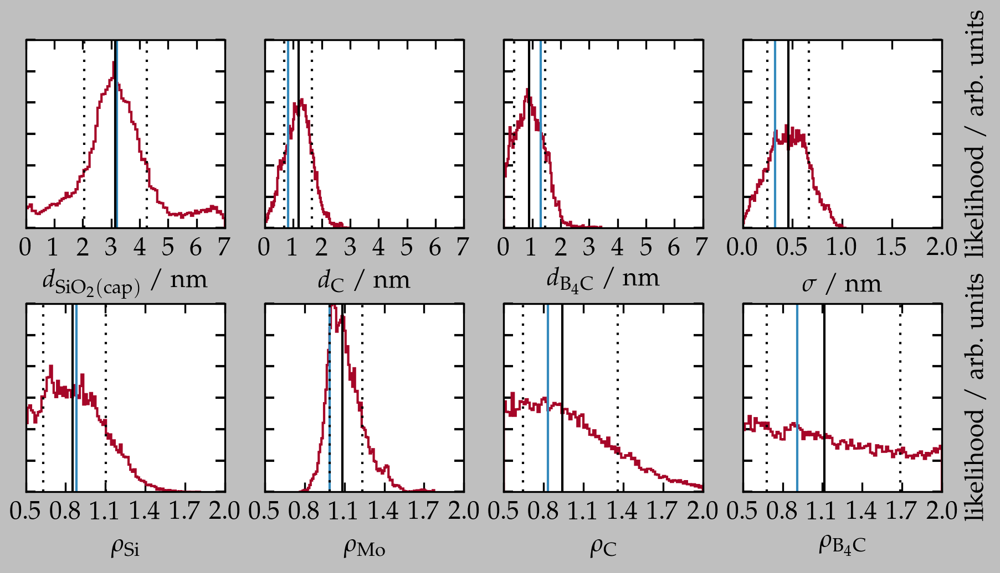

In [54]:
fig = plt.figure(figsize=fig_golden_ratio(14))
gs = gridspec.GridSpec(2,4)
gs.update(left=0, right=1.0,wspace=0.2, hspace=0.4)
ax = []
for i in xrange(2):
    for j in xrange(4):
        ax.append(fig.add_subplot(gs[i,j]))
        
ch = [chain[:,0],chain[:,3],chain[:,8],chain[:,4],chain[:,5],chain[:,6],chain[:,7],chain[:,9]]
ls = [cols[0],cols[3],cols[8],cols[4],cols[5],cols[6],cols[7],cols[9]]
ps = [p[0],p[3],p[8],p[4],p[5],p[6],p[7],p[9]]
lbs =[lb[0],lb[3],lb[8],lb[4],lb[5],lb[6],lb[7],lb[9]]
ubs =[ub[0],ub[3],ub[8],ub[4],ub[5],ub[6],ub[7],ub[9]]
        
for i,a in enumerate(ax):
    ax[i].hist(ch[i], 100, histtype='step', normed=False, color=data_color)
    ax[i].set_ylim((0.0,30000))
    ax[i].vlines(ps[i],0.0,ax[i].get_ylim()[1], color='#348ABD', linestyle="-", lw=1)
    l,u,c = np.percentile(ch[i],(50-34.1,50+34.1,50.0))
    ax[i].vlines(l,0.0,ax[i].get_ylim()[1], color='black', linestyle="dotted", lw=1)
    ax[i].vlines(u,0.0,ax[i].get_ylim()[1], color='black', linestyle="dotted", lw=1, label="$\\pm 1$ $\\sigma$")
    ax[i].vlines(c,0.0,ax[i].get_ylim()[1], color='black', linestyle="-", lw=1, label="$50\%$")
    ax[i].set_xlim((lbs[i],ubs[i]))
    ax[i].set_yticklabels(())
    ax[i].set_xlabel(ls[i])
    if i>3:
        ax[i].set_xticks((arange(0.5,2.3,0.3)))
    if i == 3 or i ==7:
        ax[i].yaxis.set_label_position('right')
        ax[i].set_ylabel("likelihood / arb. units", labelpad=10)
    #ax[i].text(0.07,0.93,"b)",transform=ax[i].transAxes,verticalalignment='top')
fig.savefig("/home/ahaase/Dropbox/PTB/Dissertation/thesis/img/PTB17_MCMC_other_params.pdf")
fig

In [55]:
l,u,c = np.percentile(chain[:,:],(50-34.1,50+34.1,50.0), axis=0)
l2,u2,c2 = np.percentile(chain[:,:],(50-(34.1+13.6),50+(34.1+13.6),50.0), axis=0)

In [56]:
cols

['$d_{\\mathrm{SiO}_2\\mathrm{(cap)}}$ / nm',
 '$d_\\mathrm{Si}$ / nm',
 '$d_\\mathrm{Mo}$ / nm',
 '$d_\\mathrm{C}$ / nm',
 '$\\sigma$ / nm',
 '$\\rho_\\mathrm{Si}$',
 '$\\rho_\\mathrm{Mo}$',
 '$\\rho_\\mathrm{C}$',
 '$d_{\\mathrm{B}_4\\mathrm{C}}$ / nm',
 '$\\rho_{\\mathrm{B}_4\\mathrm{C}}$']

In [57]:
names = ['$d_\\text{SiO$_2$(cap)}$ / nm &',
'$d_\\text{Si}$ / nm &',
'$d_\\text{Mo}$ / nm &',
'$d_\\text{C}$ / nm &',
'$\\sigma$ / nm &',
'$\\rho_\\text{Si}$ &',
'$\\rho_\\text{Mo}$ &',
'$\\rho_\\text{C}$ &',
'$d_\\text{B$_4$C}$ / nm &',
'$\\rho_\\text{B$_4$C}$ &']

In [58]:
pc

array([ 3.19439904,  2.42090645,  2.459909  ,  0.81130589,  0.32289642,
        0.88288504,  0.9886541 ,  0.83327468,  1.3081704 ,  0.90863311])

In [59]:
for i,p in enumerate(pc):
    print "%s $%.3f({%.3f}/{+%.3f})$ & $%.3f({%.3f}/{+%.3f})$ \\\\" % (names[i], np.round(c[i],3),l[i]-c[i], u[i]-c[i],c[i],l2[i]-c[i], u2[i]-c[i])

$d_\text{SiO$_2$(cap)}$ / nm & $3.139({-1.077}/{+1.108})$ & $3.139({-2.704}/{+3.378})$ \\
$d_\text{Si}$ / nm & $2.910({-0.529}/{+0.473})$ & $2.910({-1.162}/{+0.862})$ \\
$d_\text{Mo}$ / nm & $1.998({-0.422}/{+0.429})$ & $1.998({-0.789}/{+0.945})$ \\
$d_\text{C}$ / nm & $1.190({-0.516}/{+0.459})$ & $1.190({-0.947}/{+0.968})$ \\
$\sigma$ / nm & $0.456({-0.211}/{+0.206})$ & $0.456({-0.376}/{+0.399})$ \\
$\rho_\text{Si}$ & $0.851({-0.219}/{+0.253})$ & $0.851({-0.330}/{+0.491})$ \\
$\rho_\text{Mo}$ & $1.086({-0.098}/{+0.147})$ & $1.086({-0.183}/{+0.340})$ \\
$\rho_\text{C}$ & $0.941({-0.297}/{+0.418})$ & $0.941({-0.421}/{+0.846})$ \\
$d_\text{B$_4$C}$ / nm & $0.894({-0.531}/{+0.560})$ & $0.894({-0.825}/{+1.060})$ \\
$\rho_\text{B$_4$C}$ & $1.115({-0.435}/{+0.572})$ & $1.115({-0.588}/{+0.845})$ \\


In [197]:
u

array([ 5.62131145,  2.95459253,  3.69748698,  1.25435951,  0.41549251,
        0.92862391,  0.98684296,  0.91376819,  1.29333862,  0.91374269])

In [200]:
l,u,c = np.percentile(chain[:,:],(50-(34.1+13.6),50+(34.1+13.6),50.0), axis=0)

# Diffuse Scattering, DWBA

In [10]:
%cd /home/ahaase/pc/Daten/DWBA
import bigref
reload(bigref)

def eval_dwba(p, wavelength, angle_in, angle_out, structure):
    import numpy as np
    import reflectivity
    import dwba
    
    sio2, si, mo, c, s, d_si, d_mo, d_C, b4c, d_b4c = structure
    
    s, xi_l , xi_p, H = p
    beta = 0.0
    
    r=250.0
    wx=4.5
    wy=4.5
    
    omega = 4*np.arctan(wx*wy/(2*r*np.sqrt(4*r**2+wx**2+wy**2)))
    
    roughness = 0.0
    stack = [c,si,b4c,mo]
    capthicknesses = [sio2,si,b4c,mo]
    henkes = ["C",'Si',"B4C",'Mo']
    caphenkes = ["SiO2",'Si','B4C',"Mo"]
    densities = [d_C,d_si,d_b4c,d_mo]
    capdensities = [d_si,d_si,d_b4c,d_mo]
    N=49
    
    spec = reflectivity.fields_dwba(angle_in,angle_out,
                     wavelength,
                     stack, henkes,
                     N, None, roughness, "Si", densities,
                     None, 0,
                     capthicknesses,caphenkes,capdensities)

    dw = dwba.dwba_tilted_qx_fast(spec, wavelength, angle_in, xi_l, xi_p, H, s, beta)
    dwba_result = dw
    return omega*np.real(np.array(dwba_result))

def calc_cuts(p, aoi, aof, wl, structure):
    import numpy as np
    res = []   
    for n, ai in enumerate(aoi):
        dwba = eval_dwba(p, wl, aoi[n], aof[n], structure)
        res.append(dwba)
    return np.array(res)

def showimage(res, angle_in, angle_out, ls,name,clim=None, qzmin=None, qzmax=None):
    %cd /home/ahaase/pc/Daten/DWBA
    import qspace
    fig, qmap, qxgrid, qzgrid = qspace.image(np.real(np.array(res)), angle_in, angle_out, ls, "viridis", True, 2.5)
    ax = fig.get_axes()[0]
    
    real_ai=angle_in
    real_af=angle_out
    ai = np.radians(angle_in)
    af = np.radians(angle_out)
    K0 = 2*np.pi/ls
    qx = np.outer(K0,( np.sin(np.radians(real_af)) - np.sin(np.radians(real_ai)) ))
    qz = np.outer(K0,( np.cos(np.radians(real_af)) + np.cos(np.radians(real_ai)) ))
    if qzmin and qzmax:
        ax.axis([-0.4,0.4,qzmin,qzmax])
    else:
        ax.axis([-0.4,0.4,np.min(qz),np.max(qz)])
    wls=[3.1276,3.1406,3.1144]
    ar=np.radians(1.5)
    
    img = ax.get_images()[0]
    #ax.hlines(0.929,0,-0.4,colors='r',linestyles='dashed')
    if clim:
        img.set_clim([0,clim])
    img.get_cmap().set_bad('white')
    ax.text(0.05,0.9,name,transform = ax.transAxes, color='r')
    ax.axvspan(-0.025,0.025,color='white')
    fig.canvas.draw()
    return qmap, qxgrid, qzgrid

/home/ahaase/pc/Daten/DWBA


In [11]:
%cd /home/ahaase/pc/Daten/KW16_2013-04-16 EUV PTB#17 Rocking
scan_rock30 = bigref.BigRefRockingPTB17SX700(["daten/123*"],30,"daten/123_00063.hdf",2,0,3E-16,7E-16)
scan_rock30.process(["daten/123_00063.hdf","daten/123_00099.hdf","daten/123_00100.hdf","daten/123_00101.hdf"])

%cd /home/ahaase/pc/Daten/KW15_2013-04-12 EUV_PTB#17_Rocking
scan_rock135 = bigref.BigRefRockingPTB17SX700(["datenRocking/038*"],13.5,"datenRocking/038_00101.hdf",3,480,-0.7E-16, 3E-16)
scan_rock135.process(["datenRocking/038_00101.hdf","datenRocking/038_00049.hdf","datenRocking/038_00050.hdf","datenRocking/038_00051.hdf","datenRocking/038_00052.hdf"])

%cd /home/ahaase/pc/Daten/KW12_2013-03-22 EUV_PTB#17
scan4 =  bigref.BigRefTwoThetaPTB17SX700(["daten/066_*"],6.75,"daten/067.hdf","daten/068.hdf",3,-1.3E-16,-1.3E-16,3E-16)
scan4.process(0)

/home/ahaase/pc/Daten/KW16_2013-04-16 EUV PTB#17 Rocking
started processing...
finished processing 65 files!
/home/ahaase/pc/Daten/KW15_2013-04-12 EUV_PTB#17_Rocking
started processing...
finished processing 101 files!
/home/ahaase/pc/Daten/KW12_2013-03-22 EUV_PTB#17
started processing...
finished processing 76 files!


In [13]:
angle_in = ones(320)*6.75
angle_out= linspace(-10,97,320)
ls=linspace(12.0,14.0,200)

xl =5.5792008
xp = 7.51207706
sigma =  0.20079
hurst =  0.99999993

In [14]:
%cd /home/ahaase/pc/Daten/DWBA
bo = (chain[:,2]<2.75)
idx = np.nanargmax(lnp[bo])
pc = (chain[bo,:])[idx,:]
print objective(pc)
pc

/home/ahaase/pc/Daten/DWBA


NameError: name 'chain' is not defined

In [15]:
scanvar = scan_rock30
angleIn = [a for a in np.sort(np.array([float(a)+2.891 for a in scanvar._data.keys()]))]
angleOut= [30-a for a in np.sort(np.array([float(a)+2.891 for a in scanvar._data.keys()]))]
dwbares_r = calc_cuts([sigma,xl,xp,hurst], angleIn,angleOut,ls,pc)
qmap_r, qxgrid_r, qzgrid_r = showimage(dwbares_r, angleIn,angleOut,ls, "")

NameError: name 'pc' is not defined

In [71]:
scanvar = scan4
angleOut = np.sort(np.array([float(a)-scanvar._AOI for a in scanvar._data.keys()]))
angleIn = [6.75 for i in angleOut]
dwbares_tt = calc_cuts([sigma,xl,xp,hurst], angleIn,angleOut,ls,pc)
qmap_tt, qxgrid_tt, qzgrid_tt = showimage(dwbares_tt, angleIn,angleOut,ls, "")

/home/ahaase/pc/Daten/DWBA


In [93]:
%cd /home/ahaase/pc/Daten/DWBA
bo = (chain[:,2]>2.75)
idx = np.nanargmax(lnp[bo])
pc = (chain[bo,:])[idx,:]
print objective(pc)
pc

scanvar = scan_rock30
angleIn = [a for a in np.sort(np.array([float(a)+2.891 for a in scanvar._data.keys()]))]
angleOut= [30-a for a in np.sort(np.array([float(a)+2.891 for a in scanvar._data.keys()]))]
dwbares_r2 = calc_cuts([sigma,xl,xp,hurst], angleIn,angleOut,ls,pc)
qmap_r2, qxgrid_r2, qzgrid_r2 = showimage(dwbares_r2, angleIn,angleOut,ls, "")

/home/ahaase/pc/Daten/DWBA
18.2711051234
/home/ahaase/pc/Daten/DWBA


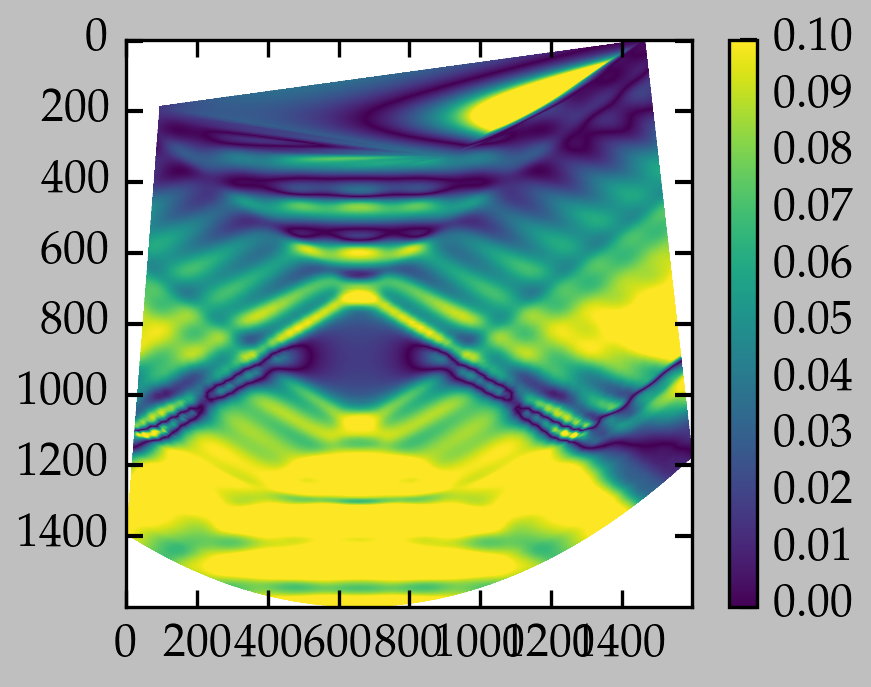

In [102]:
fig = figure()
ax = fig.add_subplot(111)
im = ax.imshow(abs(qmap_r2-qmap_r)/qmap_r, clim=(0.0,0.1), cmap='viridis')
colorbar(im, ax=ax)
fig

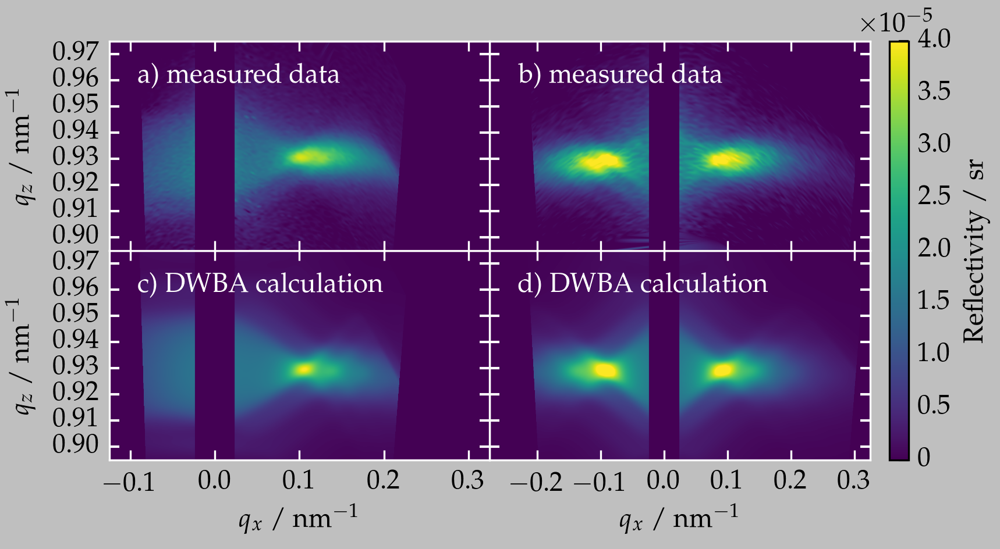

In [26]:
fig = figure(figsize=(5.905511811023622,3.0))
gs = GridSpec(2,42)
gs.update(hspace=0, wspace=0)
ax_r = fig.add_subplot(gs[1,20:40])
ax_tt = fig.add_subplot(gs[1,:20])


ax_r_m = fig.add_subplot(gs[0,20:40])
ax_tt_m = fig.add_subplot(gs[0,:20])
ax_tt_m.set_xticklabels(())
ax_r_m.set_xticklabels(())

ax_r_m.set_yticklabels(())
ax_r.set_yticklabels(())

ax_r_m.set_axis_bgcolor(cm.viridis(0))
ax_tt_m.set_axis_bgcolor(cm.viridis(0))
ax_tt.set_axis_bgcolor(cm.viridis(0))
ax_r.set_axis_bgcolor(cm.viridis(0))

plot = ax_r.imshow(qmap_r,extent=(nanmin(qxgrid_r),nanmax(qxgrid_r),nanmax(qzgrid_r),nanmin(qzgrid_r)), aspect='auto',cmap='viridis', clim=(0,4.0E-5),zorder=-2)
plot.get_cmap().set_bad(cm.viridis(0))
ax_r.axis([-0.275,0.325,0.895,0.975])
ax_tt.imshow(qmap_tt,extent=(nanmin(qxgrid_tt),nanmax(qxgrid_tt),nanmax(qzgrid_tt),nanmin(qzgrid_tt)), aspect='auto',cmap='viridis', clim=(0,4.0E-5),zorder=-2)
ax_tt.axis([-0.125,0.325,0.895,0.975])

scanvar = scan_rock30
ax_r_m.imshow(scanvar._interpolation['data'],extent=(scanvar._qx_min,scanvar._qx_max,scanvar._qz_min,scanvar._qz_max), aspect='auto',cmap='viridis', clim=(0,4.0E-5),zorder=-2)
ax_r_m.axis([-0.275,0.325,0.895,0.975])
scanvar = scan4
ax_tt_m.imshow(scanvar._interpolation['data'],extent=(scanvar._qx_min,scanvar._qx_max,scanvar._qz_min,scanvar._qz_max), aspect='auto',cmap='viridis', clim=(0,4.0E-5),zorder=-2)
ax_tt_m.axis([-0.125,0.325,0.895,0.975])

ax_tt_m.axvspan(-0.022,0.022,color=cm.viridis(0),zorder=-1)
ax_tt.axvspan(-0.022,0.022,color=cm.viridis(0),zorder=-1)
ax_r.axvspan(-0.022,0.022,color=cm.viridis(0),zorder=-1)
ax_r_m.axvspan(-0.022,0.022,color=cm.viridis(0),zorder=-1)

cax = fig.add_subplot(gs[:,41:])
cb = colorbar(plot, format='%.1e', cax=cax)
cb.set_label("Reflectivity / sr")
cax.set_title("$\\times 10^{-5}$")
cb.set_ticks([0,0.5e-5,1.0e-5,1.5e-5,2.0e-5,2.5e-5,3.0e-5,3.5e-5,4.0e-5,4.5e-5])
cb.set_ticklabels(["0","$0.5$","$1.0$","$1.5$","$2.0$","$2.5$","$3.0$","$3.5$","$4.0$","$4.5$"])

[t.set_color('white') for t in ax_r_m.yaxis.get_ticklines()]
[t.set_color('white') for t in ax_tt_m.yaxis.get_ticklines()]
[t.set_color('white') for t in ax_r_m.xaxis.get_ticklines()]
[t.set_color('white') for t in ax_tt_m.xaxis.get_ticklines()]

[t.set_color('white') for t in ax_r.yaxis.get_ticklines()]
[t.set_color('white') for t in ax_tt.yaxis.get_ticklines()]
[t.set_color('white') for t in ax_r.xaxis.get_ticklines()]
[t.set_color('white') for t in ax_tt.xaxis.get_ticklines()]

ax_tt.spines['bottom'].set_color('white')
ax_tt.spines['top'].set_color('white') 
ax_tt.spines['right'].set_color('white')
ax_tt.spines['left'].set_color('white')

ax_r.spines['bottom'].set_color('white')
ax_r.spines['top'].set_color('white') 
ax_r.spines['right'].set_color('white')
ax_r.spines['left'].set_color('white')

ax_tt_m.spines['bottom'].set_color('white')
ax_tt_m.spines['top'].set_color('white') 
ax_tt_m.spines['right'].set_color('white')
ax_tt_m.spines['left'].set_color('white')

ax_r_m.spines['bottom'].set_color('white')
ax_r_m.spines['top'].set_color('white') 
ax_r_m.spines['right'].set_color('white')
ax_r_m.spines['left'].set_color('white')

ax_r.set_xlabel("$q_x$ / nm$^{-1}$")
ax_tt.set_xlabel("$q_x$ / nm$^{-1}$")
ax_tt.set_ylabel("$q_z$ / nm$^{-1}$")
ax_tt_m.set_ylabel("$q_z$ / nm$^{-1}$")

ax_tt_m.text(0.075,0.8,'a) measured data', transform=ax_tt_m.transAxes, color='w')
ax_tt.text(0.075,0.8,'c) DWBA calculation', transform=ax_tt.transAxes, color='w')
ax_r_m.text(0.075,0.8,'b) measured data', transform=ax_r_m.transAxes, color='w')
ax_r.text(0.075,0.8,"d) DWBA calculation", transform=ax_r.transAxes, color='w')

#ax_r.set_xticks((-0.))

#fig.savefig("/home/ahaase/Dropbox/PTB/Dissertation/thesis/img/PTB17_diffuse_simulation_vs_measurement.pdf")
fig

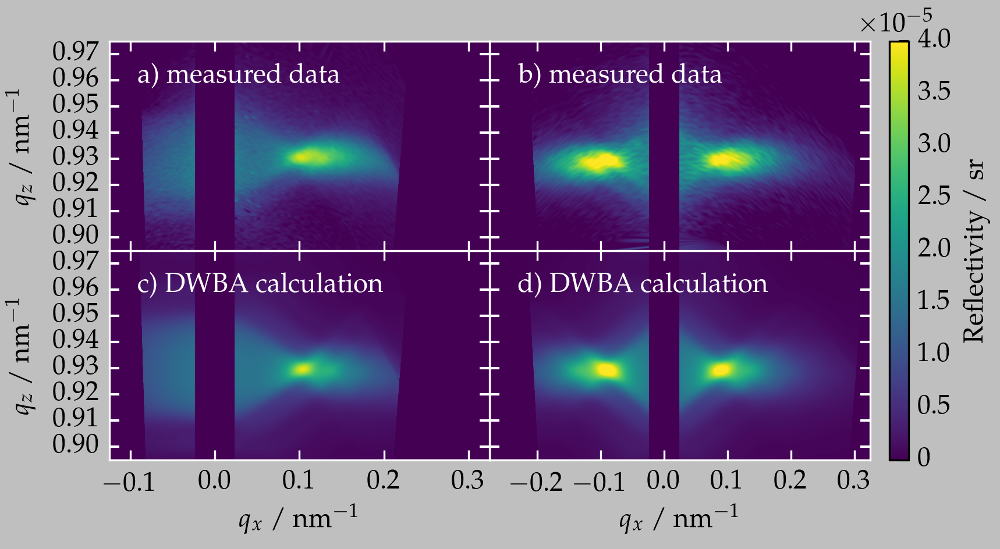

In [72]:
fig = figure(figsize=(5.905511811023622,3.0))
gs = GridSpec(2,42)
gs.update(hspace=0, wspace=0)
ax_r = fig.add_subplot(gs[1,20:40])
ax_tt = fig.add_subplot(gs[1,:20])


ax_r_m = fig.add_subplot(gs[0,20:40])
ax_tt_m = fig.add_subplot(gs[0,:20])
ax_tt_m.set_xticklabels(())
ax_r_m.set_xticklabels(())

ax_r_m.set_yticklabels(())
ax_r.set_yticklabels(())

ax_r_m.set_axis_bgcolor(cm.viridis(0))
ax_tt_m.set_axis_bgcolor(cm.viridis(0))
ax_tt.set_axis_bgcolor(cm.viridis(0))
ax_r.set_axis_bgcolor(cm.viridis(0))

plot = ax_r.imshow(qmap_r,extent=(nanmin(qxgrid_r),nanmax(qxgrid_r),nanmax(qzgrid_r),nanmin(qzgrid_r)), aspect='auto',cmap='viridis', clim=(0,4.0E-5),zorder=-2)
plot.get_cmap().set_bad(cm.viridis(0))
ax_r.axis([-0.275,0.325,0.895,0.975])
ax_tt.imshow(qmap_tt,extent=(nanmin(qxgrid_tt),nanmax(qxgrid_tt),nanmax(qzgrid_tt),nanmin(qzgrid_tt)), aspect='auto',cmap='viridis', clim=(0,4.0E-5),zorder=-2)
ax_tt.axis([-0.125,0.325,0.895,0.975])

scanvar = scan_rock30
ax_r_m.imshow(scanvar._interpolation['data'],extent=(scanvar._qx_min,scanvar._qx_max,scanvar._qz_min,scanvar._qz_max), aspect='auto',cmap='viridis', clim=(0,4.0E-5),zorder=-2)
ax_r_m.axis([-0.275,0.325,0.895,0.975])
scanvar = scan4
ax_tt_m.imshow(scanvar._interpolation['data'],extent=(scanvar._qx_min,scanvar._qx_max,scanvar._qz_min,scanvar._qz_max), aspect='auto',cmap='viridis', clim=(0,4.0E-5),zorder=-2)
ax_tt_m.axis([-0.125,0.325,0.895,0.975])

ax_tt_m.axvspan(-0.022,0.022,color=cm.viridis(0),zorder=-1)
ax_tt.axvspan(-0.022,0.022,color=cm.viridis(0),zorder=-1)
ax_r.axvspan(-0.022,0.022,color=cm.viridis(0),zorder=-1)
ax_r_m.axvspan(-0.022,0.022,color=cm.viridis(0),zorder=-1)

cax = fig.add_subplot(gs[:,41:])
cb = colorbar(plot, format='%.1e', cax=cax)
cb.set_label("Reflectivity / sr")
cax.set_title("$\\times 10^{-5}$")
cb.set_ticks([0,0.5e-5,1.0e-5,1.5e-5,2.0e-5,2.5e-5,3.0e-5,3.5e-5,4.0e-5,4.5e-5])
cb.set_ticklabels(["0","$0.5$","$1.0$","$1.5$","$2.0$","$2.5$","$3.0$","$3.5$","$4.0$","$4.5$"])

[t.set_color('white') for t in ax_r_m.yaxis.get_ticklines()]
[t.set_color('white') for t in ax_tt_m.yaxis.get_ticklines()]
[t.set_color('white') for t in ax_r_m.xaxis.get_ticklines()]
[t.set_color('white') for t in ax_tt_m.xaxis.get_ticklines()]

[t.set_color('white') for t in ax_r.yaxis.get_ticklines()]
[t.set_color('white') for t in ax_tt.yaxis.get_ticklines()]
[t.set_color('white') for t in ax_r.xaxis.get_ticklines()]
[t.set_color('white') for t in ax_tt.xaxis.get_ticklines()]

ax_tt.spines['bottom'].set_color('white')
ax_tt.spines['top'].set_color('white') 
ax_tt.spines['right'].set_color('white')
ax_tt.spines['left'].set_color('white')

ax_r.spines['bottom'].set_color('white')
ax_r.spines['top'].set_color('white') 
ax_r.spines['right'].set_color('white')
ax_r.spines['left'].set_color('white')

ax_tt_m.spines['bottom'].set_color('white')
ax_tt_m.spines['top'].set_color('white') 
ax_tt_m.spines['right'].set_color('white')
ax_tt_m.spines['left'].set_color('white')

ax_r_m.spines['bottom'].set_color('white')
ax_r_m.spines['top'].set_color('white') 
ax_r_m.spines['right'].set_color('white')
ax_r_m.spines['left'].set_color('white')

ax_r.set_xlabel("$q_x$ / nm$^{-1}$")
ax_tt.set_xlabel("$q_x$ / nm$^{-1}$")
ax_tt.set_ylabel("$q_z$ / nm$^{-1}$")
ax_tt_m.set_ylabel("$q_z$ / nm$^{-1}$")

ax_tt_m.text(0.075,0.8,'a) measured data', transform=ax_tt_m.transAxes, color='w')
ax_tt.text(0.075,0.8,'c) DWBA calculation', transform=ax_tt.transAxes, color='w')
ax_r_m.text(0.075,0.8,'b) measured data', transform=ax_r_m.transAxes, color='w')
ax_r.text(0.075,0.8,"d) DWBA calculation", transform=ax_r.transAxes, color='w')

#ax_r.set_xticks((-0.))

#fig.savefig("/home/ahaase/Dropbox/PTB/Dissertation/thesis/img/PTB17_diffuse_simulation_vs_measurement.pdf")
fig

## MCMC

In [13]:
import corner
import datetime

import matplotlib
matplotlib.use('Tkagg')
from matplotlib import pyplot as plt

#from setup_fit_e4 import *

import emcee

def lnprior(x):
    for i, y in enumerate(x):
        if y <= lb[i] or y >= ub[i]:
            return -np.inf
    return 0.0

# we use e^(-chisqr/2) as our likelihood, with chisqr from the log-intensities.
def lnlike(x):
    return -objective(x)/2

# combined probability
def lnprob(x):
    lp = lnprior(x)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike(x)

from IPython.display import clear_output
def mcmc(xopt, theview, nwalkers=100, steps=1000, start=None, filenames="progress", samplename="PS56XX", **kwargs):
    # initialize walkers around our solution from pso, using a tiny gaussian ball around xopt
    # use 500 walkers to get better statistics
    ndim = len(xopt)
    if start is None:
        start_pos = [xopt + 1e-4*np.random.randn(ndim) for i in range(nwalkers)]
    else:
        start_pos = start

    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, pool=theview, threads=None ,**kwargs)
    #sampler.run_mcmc(start_pos, steps)
    start = datetime.datetime.now()
    for sn, st in enumerate(sampler.sample(start_pos, iterations=steps)):
        #print sn
        if sn % 10== 0:
            print('MCMC: {} steps done in {}'.format(sn+1, datetime.datetime.now()-start))
            print('Total time estimate: {}'.format(steps*(datetime.datetime.now()-start)/(sn+1)))
            print('Total time remaining: {}'.format((steps-sn+1)*(datetime.datetime.now()-start)/(sn+1)))
            plot_chains_collective(sampler, fname=filenames, ndim=ndim, lim=sn)
            np.save("chain_%s_intermediate.npy" % samplename, sampler.chain)
            np.save("lnprob_%s_intermediate.npy" % samplename, sampler.lnprobability)

    # we throw away the first steps as burn-in
    samples = sampler.chain[:, :, :].reshape((-1, ndim))

    return sampler, samples

# some diagnostics
def plot_chains(sampler, fname=None, ndim=ndim, lim=1000):
    figures = {}
    for k in xrange(ndim):
        figures[cols[k]] = plt.figure()
        plt.title(cols[k])
        for i in xrange(len(sampler.chain)):
            plt.plot(sampler.chain[i,:lim,k], color='k', alpha=0.02)
    if fname is not None:
        for col in figures:
            figures[col].savefig(fname + col + '.png')
            plt.close(figures[col])
        return
    return figures

def plot_chains_collective(sampler, fname=None, ndim=ndim, lim=1000):
    figure = plt.figure(figsize=(18,14))
    ax = []
    for i in xrange(ndim):
        ax.append(figure.add_subplot(4,4,i+1))
    for k in xrange(ndim):
        ax[k].set_title(cols[k])
        for i in xrange(len(sampler.chain)):
            ax[k].plot(sampler.chain[i,:lim,k], color='k', alpha=0.02)
    if fname is not None:
        figure.savefig(fname + '.png')
        plt.close(figure)
        return
    return figures

/home/ahaase/anaconda2/lib/python2.7/site-packages/matplotlib/__init__.py:1357: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


NameError: name 'ndim' is not defined

In [14]:
def residual_dwba(p, cuts=None, structure=None):
    import numpy as np
    res = []
    datar = []
    for (ai, af, wl, dat, dat_err) in cuts:
        datar.append(dat)
    corrarr = np.nanmin(np.array(datar),axis=1)
    dat_err_percent = np.nanmax(np.array(datar))*0.01
    
    for n, (ai, af, wl, dat, dat_err) in enumerate(cuts):
        error = dat_err+dat_err_percent
        dat-=corrarr[n]
        dwba = eval_dwba(p, wl, ai, af, structure)
        res.append(np.abs((dwba-dat)/error)**2)
    res = np.array(res)
    return res/len(res)

def objective(p):
    res = residual_dwba(p, cuts, structure)
    chisq = np.sum(res)
    return chisq

In [187]:
lb, ub = ([0.0,0.0,0.0, 0.0],
          [1.0,20.0,20.0, 1.0])
cols = ["sigma", "xiparallel", "xiperp", "H"]
p = lb
structure = pc

In [188]:
cuts = bigref.cutgenerator(scan_rock30, sorted(scan_rock30._data.keys(), key=float))

In [195]:
from ipyparallel import Client


# Set up the interface to the ipcluster.
c = Client(profile='main', retries=5)
view = c[:]
lbview = c.load_balanced_view()
def push():
    view.execute("import numpy as np")
    view.execute("import reflectivity")
    view.execute("import helper")
    view.push({"lnlike": lnlike})
    view.push({"lnprior": lnprior})
    view.push({"objective": objective})
    view.push({"cols" : cols})

    view.push({"lnprob": lnprob, 
               "residual_dwba" : residual_dwba,
               "eval_dwba" : eval_dwba,
               "lb" : lb, 
               "ub" : ub, 
               "cuts" : cuts, "structure" : structure})
    print len(view)
push()

28


In [196]:
%cd /home/ahaase/Dropbox

/home/ahaase/Dropbox


In [197]:
walker = 28*4
iterations = 1000
start = np.zeros((walker,len(lb)))
for i in xrange(walker):
    for j in xrange(len(lb)):
        start[i,j] = random.uniform(lb[j]+0.01,ub[j])

#startchain = np.load("chain_%s_fixH_dwba_half.npy" % name)
#start = startchain[:,-1,:]
print "%s with %i iters" % (name, iterations)

push()


sampler, samples = mcmc(p, lbview, walker, iterations, start, samplename=name+'_dwba_rot')

PTB17 with 1000 iters
28
MCMC: 1 steps done in 0:03:57.532609
Total time estimate: 2 days, 17:58:52.923000
Total time remaining: 2 days, 18:02:50.641108
MCMC: 11 steps done in 0:21:28.886905
Total time estimate: 1 day, 8:32:51.546363
Total time remaining: 1 day, 8:15:17.006410
MCMC: 21 steps done in 0:38:53.792578
Total time estimate: 1 day, 6:52:12.996095
Total time remaining: 1 day, 6:17:01.473981
MCMC: 31 steps done in 0:56:35.486448
Total time estimate: 1 day, 6:25:31.833612
Total time remaining: 1 day, 5:32:35.418268
MCMC: 41 steps done in 1:14:27.673339
Total time estimate: 1 day, 6:16:07.647121
Total time remaining: 1 day, 5:05:17.915236
MCMC: 51 steps done in 1:32:38.368479
Total time estimate: 1 day, 6:16:27.622686
Total time remaining: 1 day, 4:47:27.234134
MCMC: 61 steps done in 1:51:06.752421
Total time estimate: 1 day, 6:21:31.032327
Total time remaining: 1 day, 4:34:02.867035
MCMC: 71 steps done in 2:09:18.155269
Total time estimate: 1 day, 6:21:09.799563
Total time remai

KeyboardInterrupt: 